<a href="https://colab.research.google.com/github/seradiazpin/NeuralNetworksUnal2019/blob/master/ProyectoFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Normalidad en equilibrio  vs Equilibrio alterado

## Importamos lo necesario
#### Instala qgrid --> !pip install qgrid


In [0]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import glob
import pandas as pd
import scipy.signal as ss
import scipy.stats as st
import math
import warnings
import sys, os

#Configuraciones de MATPLOTLIB
%matplotlib inline
matplotlib.rc('legend', numpoints=1, fontsize=16)

#No mostrar warnings
warnings.filterwarnings("ignore")

#Precision en PANDAS
pd.set_option('precision', 4)

## Carga tabla con descriptores calculados
#### Se llama --> dataset.txt



In [4]:
pd.set_option('precision', 3)
path=r'./../'
fname = 'dataset.txt'
BDSinfo = pd.read_csv(fname, sep='\t', header=0, index_col=None, engine='c', encoding='utf-8')
print("Informacion desde los %s trials cargados (un total de %s sujectos)."
      %(len(BDSinfo), len(pd.unique(BDSinfo.Subject))))
print("%s sujetos, 4 condiciones, 3 repeticiones cargados (%s filas, %s columnas)."
      %(len(pd.unique(BDSinfo.Subject)), BDSinfo.shape[0], BDSinfo.shape[1]))
print("\n\nColunmas:")
BDSinfo.keys()
#En la clase el valor 0 significa 'Equilibrio sano' y el 1 significa 'Equilibrio alterado'

Informacion desde los 1930 trials cargados (un total de 163 sujectos).
163 sujetos, 4 condiciones, 3 repeticiones cargados (1930 filas, 37 columnas).


Colunmas:


Index(['Trial', 'Subject', 'Vision', 'Surface', 'Age', 'BMI', 'Best_T',
       'COPmean_ap', 'COPmean_ml', 'COPsd_ap', 'COPsd_ml', 'COPrms_ap',
       'COPrms_ml', 'COPrange_ap', 'COPrange_ml', 'COPpath_ap', 'COPpath_ml',
       'COPvelm_ap', 'COPvelm_ml', 'COPvelm_r', 'COPvelnorm', 'COParea',
       'COPaxesL', 'COPangle', 'COPfre_p50_ap', 'COPfre_p50_ml', 'COPfrem_ap',
       'COPfrem_ml', 'COPfremax_ap', 'COPfremax_ml', 'COPpow_ap', 'COPpow_ml',
       'COPhurts_ap', 'COPhurts_ml', 'COPdfa_ap', 'COPdfa_ml', 'Clase'],
      dtype='object')

In [5]:
BDSinfo.head(5)

,Trial,Subject,Vision,Surface,Age,BMI,Best_T,COPmean_ap,COPmean_ml,COPsd_ap,COPsd_ml,COPrms_ap,COPrms_ml,COPrange_ap,COPrange_ml,COPpath_ap,COPpath_ml,COPvelm_ap,COPvelm_ml,COPvelm_r,COPvelnorm,COParea,COPaxesL,COPangle,COPfre_p50_ap,COPfre_p50_ml,COPfrem_ap,COPfrem_ml,COPfremax_ap,COPfremax_ml,COPpow_ap,COPpow_ml,COPhurts_ap,COPhurts_ml,COPdfa_ap,COPdfa_ml,Clase
0,BDS00001,1,Open,Firm,33.0,21.849,25,-2.995e-17,3.041e-17,0.285,0.095,0.285,0.095,1.665,0.600,33.408,11.506,0.557,0.192,0.620,0.589,0.466,0.706,-171.187,0.133,0.100,0.268,0.190,0.100,0.033,0.068,0.010,0.920,0.811,1.431,1.508,0
1,BDS00002,1,Open,Firm,33.0,21.849,25,-4.718e-18,6.472e-17,0.370,0.140,0.370,0.140,2.262,0.777,37.758,12.569,0.629,0.209,0.697,0.663,0.978,0.907,178.550,0.067,0.067,0.141,0.155,0.033,0.033,0.162,0.018,0.905,0.838,1.447,1.597,0
2,BDS00003,1,Open,Firm,33.0,21.849,25,5.075e-17,1.109e-16,0.206,0.112,0.206,0.112,1.185,0.653,35.681,11.429,0.595,0.190,0.651,0.624,0.431,0.507,-175.148,0.200,0.067,0.347,0.153,0.067,0.033,0.039,0.009,0.908,0.816,1.354,1.506,0
3,BDS00004,1,Closed,Firm,33.0,21.849,25,-1.658e-17,3.828e-17,0.181,0.097,0.181,0.097,1.037,0.571,32.653,10.967,0.544,0.183,0.604,0.574,0.332,0.444,-179.020,0.233,0.100,0.363,0.208,0.033,0.033,0.030,0.008,0.910,0.827,1.312,1.547,0
4,BDS00005,1,Closed,Firm,33.0,21.849,25,-6.560e-18,-1.539e-16,0.380,0.158,0.380,0.158,2.090,0.927,36.675,11.665,0.611,0.194,0.671,0.641,1.124,0.932,176.718,0.100,0.067,0.171,0.123,0.067,0.033,0.092,0.017,0.903,0.823,1.473,1.608,0


## Individuos con emfermedades que afectan el equilibrio

In [6]:
data = BDSinfo[BDSinfo['Clase']==1]
print('%s subjetos.' %len(pd.unique(data.Subject)))
print("Informacion de %s sujetos por 4 condiciones cargados (%s filas, %s columnas)."
      %(len(pd.unique(data.Subject)), data.shape[0], data.shape[1]))
data.head(5)

49 subjetos.
Informacion de 49 sujetos por 4 condiciones cargados (562 filas, 37 columnas).


,Trial,Subject,Vision,Surface,Age,BMI,Best_T,COPmean_ap,COPmean_ml,COPsd_ap,COPsd_ml,COPrms_ap,COPrms_ml,COPrange_ap,COPrange_ml,COPpath_ap,COPpath_ml,COPvelm_ap,COPvelm_ml,COPvelm_r,COPvelnorm,COParea,COPaxesL,COPangle,COPfre_p50_ap,COPfre_p50_ml,COPfrem_ap,COPfrem_ml,COPfremax_ap,COPfremax_ml,COPpow_ap,COPpow_ml,COPhurts_ap,COPhurts_ml,COPdfa_ap,COPdfa_ml,Clase
564,BDS00565,48,Closed,Foam,34.333,24.262,22,6.785e-17,-5.842e-16,0.934,0.586,0.934,0.586,5.573,4.216,114.892,84.664,1.915,1.411,2.615,2.379,10.312,2.288,-178.883,0.333,0.400,0.351,0.425,0.400,0.400,1.041,0.416,0.959,0.959,1.565,1.428,1
565,BDS00566,48,Closed,Foam,34.333,24.262,22,-4.567e-16,-1.601e-16,1.092,0.605,1.092,0.605,5.681,3.490,103.763,84.947,1.729,1.416,2.473,2.235,12.350,2.685,-174.264,0.233,0.300,0.271,0.352,0.033,0.100,0.849,0.355,0.960,0.961,1.566,1.473,1
566,BDS00567,48,Closed,Foam,34.333,24.262,22,-3.566e-16,-7.235e-18,0.975,0.584,0.975,0.584,5.200,4.120,105.819,78.367,1.764,1.306,2.412,2.195,10.532,2.412,-170.047,0.233,0.333,0.281,0.336,0.033,0.100,0.972,0.309,0.966,0.956,1.561,1.469,1
567,BDS00568,48,Closed,Firm,34.333,24.262,22,4.480e-16,5.657e-16,0.477,0.306,0.477,0.306,2.179,1.540,52.407,28.986,0.873,0.483,1.081,0.998,1.982,1.302,-151.708,0.067,0.067,0.270,0.251,0.033,0.033,0.128,0.053,0.941,0.938,1.226,1.345,1
568,BDS00569,48,Closed,Firm,34.333,24.262,22,2.761e-16,-1.482e-16,0.358,0.164,0.358,0.164,1.967,1.028,33.013,23.458,0.550,0.391,0.742,0.675,0.997,0.896,-166.839,0.133,0.367,0.226,0.392,0.033,0.033,0.085,0.019,0.946,0.938,1.434,1.319,1


## Revisamos cardinales de clases

In [7]:
data = BDSinfo.copy()
data[['Clase', 'Trial']].groupby(['Clase']).count()

,Trial
Clase,
0,1368
1,562


## Separacion por ejercicio

In [164]:
#Trabajo con una copia
#Universo 1: Ojos abiertos en plataforma estable
U1=data.loc[(data.Vision =='Open') & (data.Surface =='Firm')].copy()
print("Universo 1: ojos abiertos y superficie estable. %s registros con %s variables."%(U1.shape[0], U1.shape[1]))
print(U1[['Clase', 'Trial']].groupby(['Clase']).count())

#Universo 2: Ojos cerrados en plataforma estable
U2=data.loc[(data.Vision =='Closed') & (data.Surface =='Firm')].copy()
print("\n\nUniverso 2: ojos cerrados y superficie estable. %s registros con %s variables."%(U2.shape[0], U2.shape[1]))
print(U2[['Clase', 'Trial']].groupby(['Clase']).count())

#Universo 3: Ojos abiertos en plataforma inestable 
U3=data.loc[(data.Vision =='Open') & (data.Surface =='Foam')].copy()
print("\n\nUniverso 3: ojos abiertos y superficie inestable. %s registros con %s variables."%(U3.shape[0], U3.shape[1]))
print(U3[['Clase', 'Trial']].groupby(['Clase']).count())

#Universo 4: Ojos cerrados en plataforma inestable
U4=data.loc[(data.Vision =='Closed') & (data.Surface =='Foam')].copy()
print("\n\nUniverso 4: ojos cerrados y superficie inestable.%s registros con %s variables."%(U4.shape[0], U4.shape[1]))
print(U4[['Clase', 'Trial']].groupby(['Clase']).count())

Universo 1: ojos abiertos y superficie estable. 489 registros con 37 variables.
       Trial
Clase       
0        342
1        147


Universo 2: ojos cerrados y superficie estable. 487 registros con 37 variables.
       Trial
Clase       
0        342
1        145


Universo 3: ojos abiertos y superficie inestable. 480 registros con 37 variables.
       Trial
Clase       
0        342
1        138


Universo 4: ojos cerrados y superficie inestable.474 registros con 37 variables.
       Trial
Clase       
0        342
1        132


## Escojemos un universo para explorar

In [165]:
#Lo mas comun een estabilometria es ojos abiertos con plataforma firme
universe=U1.copy()


print("Informacion de %s sujetos (%s filas, %s columnas)." %(len(universe), universe.shape[0], universe.shape[1]))
universe.head(5)
#extraemos las caractristicas desde el dataset
features = list(universe)[4:-1]
print(features)

Informacion de 489 sujetos (489 filas, 37 columnas).
['Age', 'BMI', 'Best_T', 'COPmean_ap', 'COPmean_ml', 'COPsd_ap', 'COPsd_ml', 'COPrms_ap', 'COPrms_ml', 'COPrange_ap', 'COPrange_ml', 'COPpath_ap', 'COPpath_ml', 'COPvelm_ap', 'COPvelm_ml', 'COPvelm_r', 'COPvelnorm', 'COParea', 'COPaxesL', 'COPangle', 'COPfre_p50_ap', 'COPfre_p50_ml', 'COPfrem_ap', 'COPfrem_ml', 'COPfremax_ap', 'COPfremax_ml', 'COPpow_ap', 'COPpow_ml', 'COPhurts_ap', 'COPhurts_ml', 'COPdfa_ap', 'COPdfa_ml']


# Pre-procesando los datos

In [0]:
# Inputs y outputs
X = universe.loc[:, features].values
Y = universe.loc[:,['Clase']].values
X.shape

(489, 32)

In [0]:
#Normalizando los datos
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)
X.shape

(489, 32)

In [0]:
#Codificando las clases para que sean binarias, si es que no lo son.
#from sklearn.preprocessing import OneHotEncoder
#ohe = OneHotEncoder()
#y = ohe.fit_transform(y).toarray()

In [0]:
#Dividiendo el dataset 90% vs 10%
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = 0.1)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(440, 32)
(49, 32)
(440, 1)
(49, 1)


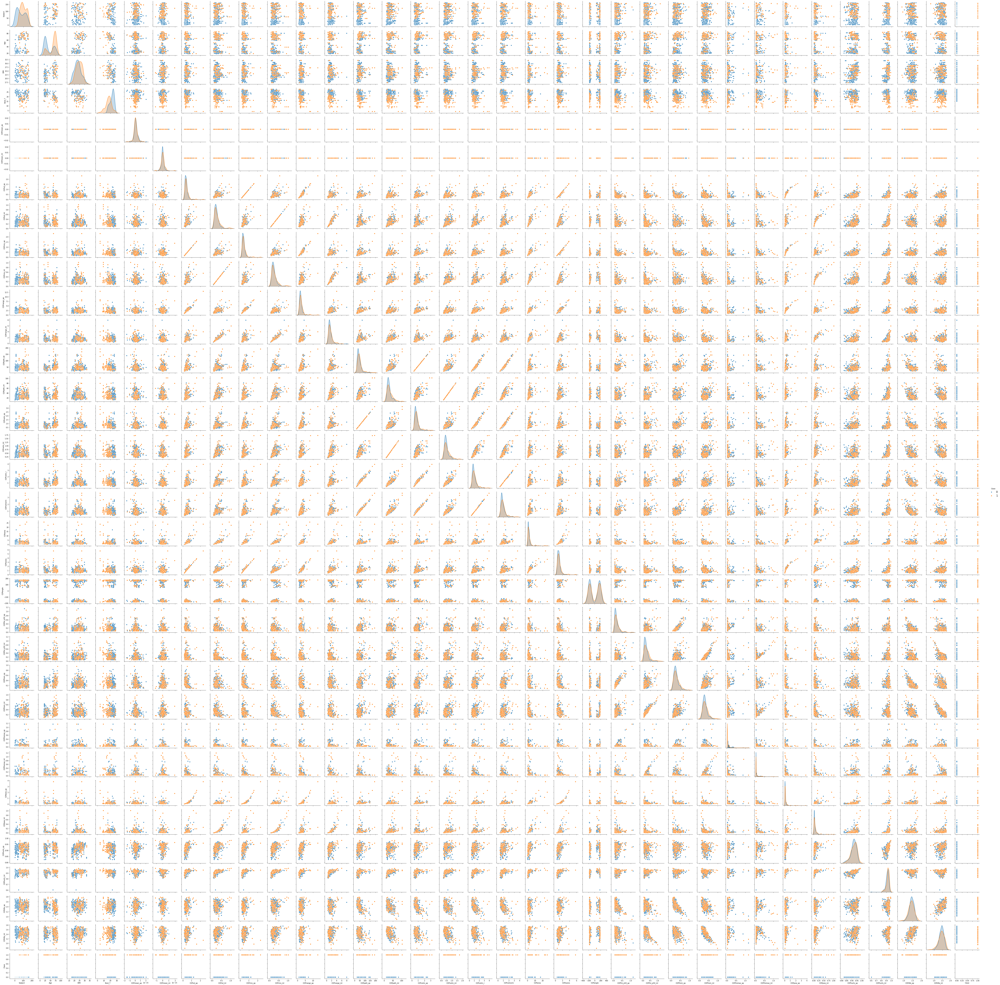

In [0]:
import seaborn as sns
sns.pairplot(universe, hue='Clase')

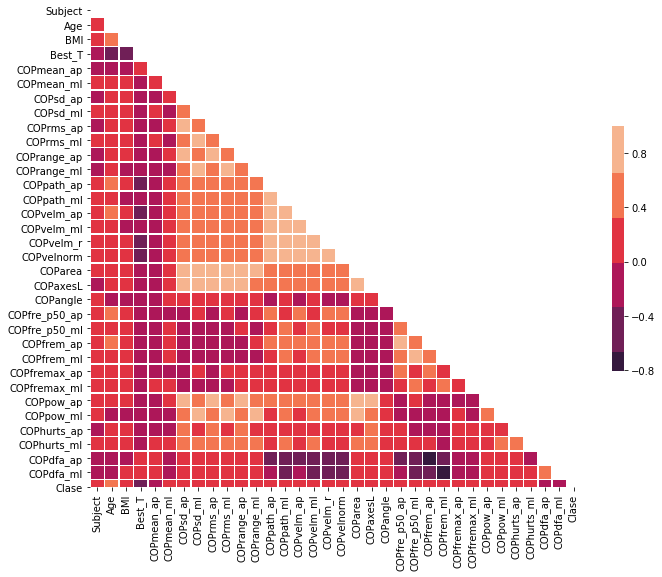

In [166]:
import seaborn as sns
corr = U1.copy().corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=sns.color_palette("rocket"), vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Complete chart
#fig, ax = plt.subplots(figsize=(40,40)) 
#sns.heatmap(corr, annot=True, ax=ax)



In [0]:
corr_matrix = universe.corr()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
universe.drop(to_drop, axis=1, inplace=True)

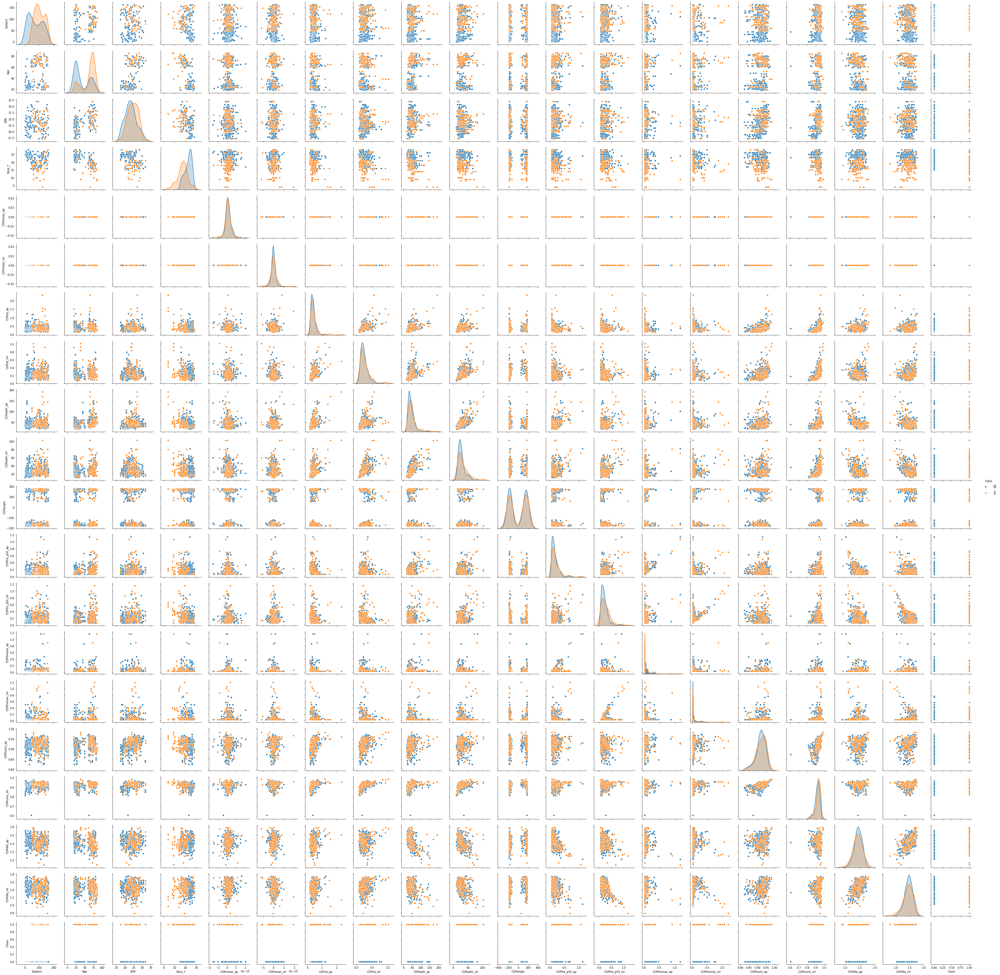

In [0]:
import seaborn as sns
sns.pairplot(universe, hue='Clase')

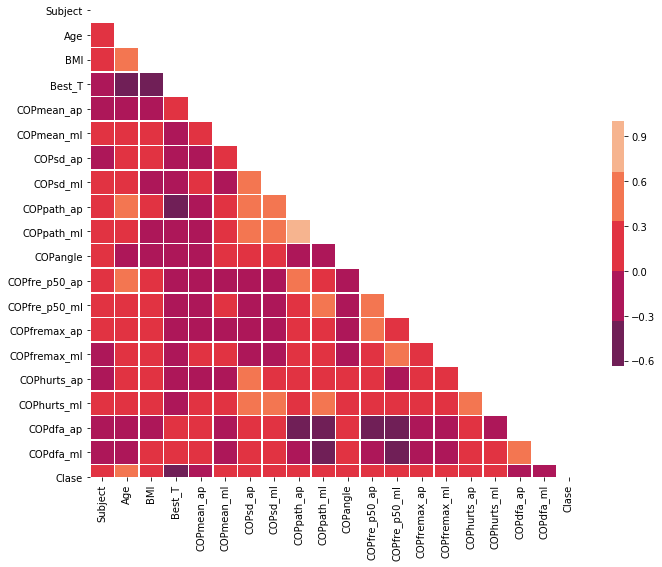

In [168]:
import seaborn as sns
corr = universe.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=sns.color_palette("rocket"), vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

#Complete heatmap
#fig, ax = plt.subplots(figsize=(15,15)) 
#sns.heatmap(corr, annot=True, ax=ax)

In [184]:
features = list(universe)[4:-1]
X = universe.loc[:,features].values
Y = universe.loc[:,['Clase']].values
X.shape
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)
X.shape
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = 0.1)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(440, 18)
(49, 18)
(440, 1)
(49, 1)


# MLP en Keras

In [0]:
#!pip install tensorflow
from keras.models import Sequential
from keras.layers import Dense
from keras import initializers
# Fija las semillas aleatorias para la reproducibilidad
np.random.seed(7)

In [0]:
# Crea el modelo
model = Sequential()
#Agregamos una capa de entrada de 12 neuronas y una capa oculta de 10 neuronas
model.add(Dense(9, input_dim=18, activation='relu'))
#print(model.weights)
#Agregamos una segunda capa oculta de 8 neuronas
model.add(Dense(4, activation='relu'))
#Agregamos una capa de salida de una neurona
model.add(Dense(1, activation='sigmoid'))

In [186]:
# Compila el modelo.
# Especificamos la funcion de perdida, el metodo de optimizador y la metrica
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()



Model: "sequential_62"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_181 (Dense)            (None, 9)                 171       
_________________________________________________________________
dense_182 (Dense)            (None, 4)                 40        
_________________________________________________________________
dense_183 (Dense)            (None, 1)                 5         
Total params: 216
Trainable params: 216
Non-trainable params: 0
_________________________________________________________________
Model 85 found


In [185]:
# Entrenamos el modelo
# Iteraciones=100. Cada cuanto se actualizan los pesos = 10
history = model.fit(X_train, y_train, epochs=100, batch_size=20)

Epoch 1/100


KeyboardInterrupt: ignored

In [0]:
# Si se quisisera verificar la precisio después de cada época, pero no quiero.
#history = model.fit(X_train, y_train,validation_data = (X_test,y_test), epochs=100, batch_size=64)

In [187]:
# Evalua el modelo contra si mismo
scores = model.evaluate(X_train, y_train)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

440/440 [==============================] - 1s 3ms/step

acc: 88.18%


In [0]:
# Calcula y redondeamos las predicciones
y_pred_round = np.round(model.predict(X_test))

In [0]:
# En el caso de tener varias clases se realiza el proceso inverso 
#Convertiendo las predicciones a clases
#y_pred = model.predict(X_test)
#pred = list()
#for i in range(len(y_pred)):
#    pred.append(np.argmax(y_pred[i]))
#Convertiendo la codificacion a clases
#test = list()
#for i in range(len(y_test)):
#    test.append(np.argmax(y_test[i]))

In [189]:
from sklearn.metrics import accuracy_score
a = accuracy_score(y_pred_round,y_test)
print('Precisión:', a*100)
model.save_weights("model.h5")

Precisión: 87.75510204081633


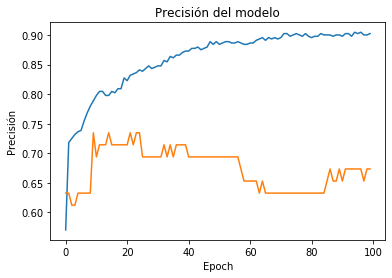

In [0]:
import matplotlib.pyplot as plt
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
#plt.plot(history.history['val_accuracy'])
plt.title('Precisión del modelo')
plt.ylabel('Precisión')
plt.xlabel('Epoch')
#plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

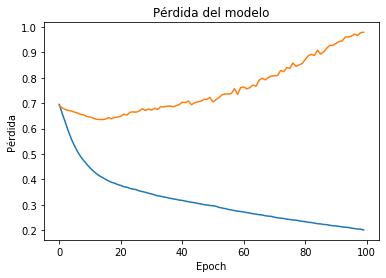

In [0]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss']) 
plt.title('Pérdida del modelo') 
plt.ylabel('Pérdida') 
plt.xlabel('Epoch') 
#plt.legend(['Train', 'Test'], loc='upper left') 
plt.show()

#Mejor Configuracion


In [224]:
features = list(universe)[4:-1]
X = universe.loc[:,features].values
Y = universe.loc[:,['Clase']].values
X.shape
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)
X.shape

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = 0.3, stratify=Y)

features = list(universe)[4:-1]
X = universe.loc[:,features].values
Y = universe.loc[:,['Clase']].values
X.shape

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

from keras.models import Sequential
from keras.layers import Dense
from keras import initializers
from keras.constraints import max_norm
# Fija las semillas aleatorias para la reproducibilidad
np.random.seed(10)


# Crea el modelo
model = Sequential()
#Agregamos una capa de entrada de 12 neuronas y una capa oculta de 10 neuronas
model.add(Dense(9, input_dim=18, activation='relu'))
#print(model.weights)
#Agregamos una segunda capa oculta de 8 neuronas
model.add(Dense(4, activation='relu'))
#Agregamos una capa de salida de una neurona
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()
cargar = True
if(cargar):
  try:
    print("Model 85 found")
    model.load_weights("model85a.h5")
  except:
    print("No model found")

if(not cargar):
  history = model.fit(X_train, y_train,validation_data = (X_test,y_test), epochs=150, batch_size=20)
  import matplotlib.pyplot as plt
  plt.plot(history.history['acc'])
  plt.plot(history.history['val_acc'])
  #plt.plot(history.history['val_accuracy'])
  plt.title('Precisión del modelo')
  plt.ylabel('Precisión')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss']) 
  plt.title('Pérdida del modelo') 
  plt.ylabel('Pérdida') 
  plt.xlabel('Epoch') 
  plt.legend(['Train', 'Test'], loc='upper left') 
  plt.show()

scores = model.evaluate(X_train, y_train)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
# Calcula y redondeamos las predicciones
y_pred_round = np.round(model.predict(X_test))
from sklearn.metrics import accuracy_score
a = accuracy_score(y_pred_round,y_test)
print('Precisión:', a*100)
model.save_weights("model.h5")

(342, 18)
(147, 18)
(342, 1)
(147, 1)
Model: "sequential_92"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_271 (Dense)            (None, 9)                 171       
_________________________________________________________________
dense_272 (Dense)            (None, 4)                 40        
_________________________________________________________________
dense_273 (Dense)            (None, 1)                 5         
Total params: 216
Trainable params: 216
Non-trainable params: 0
_________________________________________________________________
Model 85 found
342/342 [==============================] - 2s 6ms/step

acc: 86.84%
Precisión: 91.15646258503402


#Pruebas Redes


In [149]:
features = list(universe)[4:-1]
X = universe.loc[:,features].values
Y = universe.loc[:,['Clase']].values
X.shape
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)
X.shape

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = 0.35, stratify=Y)

features = list(universe)[4:-1]
X = universe.loc[:,features].values
Y = universe.loc[:,['Clase']].values
X.shape

from sklearn.decomposition import PCA
pca = PCA(.95)
pca.fit(X_train)
X_train = pca.transform(X_train)
X_test = pca.transform(X_test)



print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

from keras.models import Sequential
from keras.layers import Dense
from keras import initializers
from keras.constraints import max_norm
# Fija las semillas aleatorias para la reproducibilidad
np.random.seed(7)


# Crea el modelo
model = Sequential()
#Agregamos una capa de entrada de 12 neuronas y una capa oculta de 10 neuronas
model.add(Dense(13, input_dim=13, activation='relu'))
#print(model.weights)
#Agregamos una segunda capa oculta de 8 neuronas
model.add(Dense(7, activation='relu'))
#Agregamos una capa de salida de una neurona
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

history = model.fit(X_train, y_train,validation_data = (X_test,y_test), epochs=100, batch_size=10)
import matplotlib.pyplot as plt
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
#plt.plot(history.history['val_accuracy'])
plt.title('Precisión del modelo')
plt.ylabel('Precisión')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss']) 
plt.title('Pérdida del modelo') 
plt.ylabel('Pérdida') 
plt.xlabel('Epoch') 
plt.legend(['Train', 'Test'], loc='upper left') 
plt.show())


(317, 13)
(172, 13)
(317, 1)
(172, 1)
Model: "sequential_59"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_172 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_173 (Dense)            (None, 7)                 98        
_________________________________________________________________
dense_174 (Dense)            (None, 1)                 8         
Total params: 288
Trainable params: 288
Non-trainable params: 0
_________________________________________________________________
Model 85 found
No model found


In [207]:
scores = model.evaluate(X_train, y_train)
print("\n%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
# Calcula y redondeamos las predicciones
y_pred_round = np.round(model.predict(X_test))
from sklearn.metrics import accuracy_score
a = accuracy_score(y_pred_round,y_test)
print('Precisión:', a*100)
model.save_weights("model.h5")

print('Y Class 0',len(Y[Y == 0]))
print('Y class 1',len(Y[Y == 1]))
print('train class 1',len(y_train[y_train == 1]))
print('train class 0',len(y_train[y_train == 0]))
print('test class 1',len(y_test[y_test == 1]))
print('test class 0',len(y_test[y_test == 0]))

342/342 [==============================] - 0s 79us/step

acc: 89.18%
Precisión: 72.78911564625851
Y Class 0 342
Y class 1 147
train class 1 103
train class 0 239
test class 1 44
test class 0 103


In [0]:
features = list(universe)[4:-1]
X2 = universe.loc[:,features].values
Y2 = universe.loc[:,['Clase']].values
X2.shape
from sklearn.preprocessing import StandardScaler
X2 = StandardScaler().fit_transform(X2)
X2.shape
from sklearn.model_selection import train_test_split
X_train2,X_test2,y_train2,y_test2 = train_test_split(X2,Y2,test_size = 0.3)


print('Y Class 0',len(Y2[Y2 == 0]))
print('Y class 1',len(Y2[Y2 == 1]))
print('train class 1',len(y_train2[y_train2== 1]))
print('train class 0',len(y_train2[y_train2 == 0]))
print('test class 1',len(y_test2[y_test2 == 1]))
print('test class 0',len(y_test2[y_test2 == 0]))

Y Class 0 342
Y class 1 147
train class 1 95
train class 0 247
test class 1 52
test class 0 95
